In [2]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import os

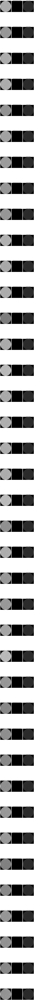

In [2]:
#Sample 2 has a relatively high amount of fracture-filling carbonate mineralization occurring in the sample

# Folder path
folder_path = "/Users/anna/Desktop/XCT/SlicesCropped/2A-85-crop/"

# Filenames
image_files = ["2A-150-85kv.png","2A-200-85kv.png","2A-250-85kv.png","2A-300-85kv.png","2A-350-85kv.png","2A-400-85kv.png",
               "2A-450-85kv.png","2A-500-85kv.png","2A-550-85kv.png","2A-600-85kv.png","2A-650-85kv.png","2A-700-85kv.png","2A-750-85kv.png",
               "2A-800-85kv.png","2A-850-85kv.png","2A-900-85kv.png","2A-950-85kv.png","2A-1000-85kv.png","2A-1050-85kv.png","2A-1100-85kv.png"
               ,"2A-1150-85kv.png","2A-1200-85kv.png","2A-1250-85kv.png","2A-1300-85kv.png", "2A-1350-85kv.png","2A-1400-85kv.png","2A-1450-85kv.png","2A-1500-85kv.png","2A-1550-85kv.png"
               ,"2A-1600-85kv.png","2A-1650-85kv.png","2A-1700-85kv.png","2A-1750-85kv.png","2A-1800-85kv.png","2A-1850-85kv.png","2A-1900-85kv.png","2A-1950-85kv.png","2A-2000-85kv.png","2A-2050-85kv.png"]
#serpentine
#lower_threshold = 54
#upper_threshold = 55

#Carbonate
lower_threshold = 60
upper_threshold = 61

# Create a figure for the images and overlays
plt.figure(figsize=(12, 9 * len(image_files)))

# Loop through each image file
for i, image_file in enumerate(image_files):
    # Full path to the image
    image_path = os.path.join(folder_path, image_file)
    
    # Load the image and convert to grayscale
    ct_image = Image.open(image_path).convert("L")
    
    # Convert the image to a NumPy array
    ct_array = np.array(ct_image)
    
    # Create a mask for the segmented region
    segmented_mask = (ct_array >= lower_threshold) & (ct_array <= upper_threshold)
    
    # Create a color overlay with transparency
    overlay = np.zeros((*ct_array.shape, 3), dtype=np.uint8)  # Create an RGB image
    overlay[..., 0] = 255  # Red channel for the overlay
    overlay[~segmented_mask] = 0  # Set non-segmented areas to black
    
    # Combine original image and overlay using alpha blending
    alpha = 0.5  # Transparency level (0 = fully transparent, 1 = fully opaque)
    overlayed_image = np.dstack([ct_array] * 3)  # Convert grayscale to RGB
    overlayed_image = overlayed_image * (1 - alpha) + overlay * alpha
    
    # Plot the original, segmented, and overlayed images
    plt.subplot(len(image_files), 3, 3 * i + 1)
    plt.imshow(ct_array, cmap="gray")
    plt.title(f"Original CT Scan Image: {image_file}")
    plt.axis("off")
    
    plt.subplot(len(image_files), 3, 3 * i + 2)
    plt.imshow(segmented_mask, cmap="gray")
    plt.title(f"Segmented Mask ({lower_threshold}-{upper_threshold} Intensity)")
    plt.axis("off")
    
    plt.subplot(len(image_files), 3, 3 * i + 3)
    plt.imshow(overlayed_image.astype(np.uint8))
    plt.title(f"Overlayed Image")
    plt.axis("off")

plt.tight_layout()
#plt.savefig('1A-85-350-segmented(40-41).png')
plt.show()

In [7]:
# Folder path
folder_path = "/Users/anna/Desktop/XCT/SlicesCropped/2A-85-crop/"

# Filenames
image_files = ["2A-150-85kv.png","2A-200-85kv.png","2A-250-85kv.png","2A-300-85kv.png","2A-350-85kv.png","2A-400-85kv.png",
               "2A-450-85kv.png","2A-500-85kv.png","2A-550-85kv.png","2A-600-85kv.png","2A-650-85kv.png","2A-700-85kv.png","2A-750-85kv.png",
               "2A-800-85kv.png","2A-850-85kv.png","2A-900-85kv.png","2A-950-85kv.png","2A-1000-85kv.png","2A-1050-85kv.png","2A-1100-85kv.png"
               ,"2A-1150-85kv.png","2A-1200-85kv.png","2A-1250-85kv.png","2A-1300-85kv.png", "2A-1350-85kv.png","2A-1400-85kv.png","2A-1450-85kv.png","2A-1500-85kv.png","2A-1550-85kv.png"
               ,"2A-1600-85kv.png","2A-1650-85kv.png","2A-1700-85kv.png","2A-1750-85kv.png","2A-1800-85kv.png","2A-1850-85kv.png","2A-1900-85kv.png","2A-1950-85kv.png","2A-2000-85kv.png","2A-2050-85kv.png"]


# Intensity threshold
lower_threshold = 60
upper_threshold = 61

total_core_pixels = 0
total_core_segmented_pixels = 0

# Loop through each image file
for image_file in image_files:
    # Full path to the image
    image_path = os.path.join(folder_path, image_file)
    
    # Load the image and convert to grayscale
    ct_image = Image.open(image_path).convert("L")
    
    # Convert the image to a NumPy array
    ct_array = np.array(ct_image)
    
    # Create a mask for the segmented region
    segmented_mask = (ct_array >= lower_threshold) & (ct_array <= upper_threshold)
    
    # Calculate percentage
    total_pixels = ct_array.size
    segmented_pixels = np.sum(segmented_mask)
    percentage = (segmented_pixels / total_pixels) * 100
    
    print(f"Image: {image_file} - Percentage of pixels in range {lower_threshold}-{upper_threshold}: {percentage:.2f}%")
    
    # Accumulate totals for entire core
    total_core_pixels += total_pixels
    total_core_segmented_pixels += segmented_pixels

# Calculate overall percentage for the entire core
if total_core_pixels > 0:
    total_core_percentage = (total_core_segmented_pixels / total_core_pixels) * 100
    print(f"Total Core - Percentage of pixels in range {lower_threshold}-{upper_threshold}: {total_core_percentage:.2f}%")

Image: 2A-150-85kv.png - Percentage of pixels in range 60-61: 0.00%
Image: 2A-200-85kv.png - Percentage of pixels in range 60-61: 0.00%
Image: 2A-250-85kv.png - Percentage of pixels in range 60-61: 0.00%
Image: 2A-300-85kv.png - Percentage of pixels in range 60-61: 0.00%
Image: 2A-350-85kv.png - Percentage of pixels in range 60-61: 0.00%
Image: 2A-400-85kv.png - Percentage of pixels in range 60-61: 0.00%
Image: 2A-450-85kv.png - Percentage of pixels in range 60-61: 0.00%
Image: 2A-500-85kv.png - Percentage of pixels in range 60-61: 0.00%
Image: 2A-550-85kv.png - Percentage of pixels in range 60-61: 0.00%
Image: 2A-600-85kv.png - Percentage of pixels in range 60-61: 0.00%
Image: 2A-650-85kv.png - Percentage of pixels in range 60-61: 0.00%
Image: 2A-700-85kv.png - Percentage of pixels in range 60-61: 0.00%
Image: 2A-750-85kv.png - Percentage of pixels in range 60-61: 0.00%
Image: 2A-800-85kv.png - Percentage of pixels in range 60-61: 0.00%
Image: 2A-850-85kv.png - Percentage of pixels in

In [3]:
# Folder path
folder_path = "/Users/anna/Desktop/XCT/SlicesCropped/2A-135-crop/"

# Filenames
image_files = ["2A-150-135kv.png","2A-200-135kv.png","2A-250-135kv.png","2A-300-135kv.png","2A-350-135kv.png","2A-400-135kv.png",
               "2A-450-135kv.png","2A-500-135kv.png","2A-550-135kv.png","2A-600-135kv.png","2A-650-135kv.png","2A-700-135kv.png","2A-750-135kv.png",
               "2A-800-135kv.png","2A-850-135kv.png","2A-900-135kv.png","2A-950-135kv.png","2A-1000-135kv.png","2A-1050-135kv.png","2A-1100-135kv.png"
               ,"2A-1150-135kv.png","2A-1200-135kv.png","2A-1250-135kv.png","2A-1300-135kv.png", "2A-1350-135kv.png","2A-1400-135kv.png","2A-1450-135kv.png","2A-1500-135kv.png","2A-1550-135kv.png"
               ,"2A-1600-135kv.png","2A-1650-135kv.png","2A-1700-135kv.png","2A-1750-135kv.png","2A-1800-135kv.png","2A-1850-135kv.png","2A-1900-135kv.png","2A-1950-135kv.png","2A-2000-135kv.png","2A-2050-135kv.png"]

#serpentine
#lower_threshold = 54
#upper_threshold = 55

#Carbonate
lower_threshold = 61
upper_threshold = 62

# Create a figure for the images and overlays
plt.figure(figsize=(12, 9 * len(image_files)))

# Loop through each image file
for i, image_file in enumerate(image_files):
    # Full path to the image
    image_path = os.path.join(folder_path, image_file)
    
    # Load the image and convert to grayscale
    ct_image = Image.open(image_path).convert("L")
    
    # Convert the image to a NumPy array
    ct_array = np.array(ct_image)
    
    # Create a mask for the segmented region
    segmented_mask = (ct_array >= lower_threshold) & (ct_array <= upper_threshold)
    
    # Create a color overlay with transparency
    overlay = np.zeros((*ct_array.shape, 3), dtype=np.uint8)  # Create an RGB image
    overlay[..., 0] = 255  # Red channel for the overlay
    overlay[~segmented_mask] = 0  # Set non-segmented areas to black
    
    # Combine original image and overlay using alpha blending
    alpha = 0.5  # Transparency level (0 = fully transparent, 1 = fully opaque)
    overlayed_image = np.dstack([ct_array] * 3)  # Convert grayscale to RGB
    overlayed_image = overlayed_image * (1 - alpha) + overlay * alpha
    
    # Plot the original, segmented, and overlayed images
    plt.subplot(len(image_files), 3, 3 * i + 1)
    plt.imshow(ct_array, cmap="gray")
    plt.title(f"Original CT Scan Image: {image_file}")
    plt.axis("off")
    
    plt.subplot(len(image_files), 3, 3 * i + 2)
    plt.imshow(segmented_mask, cmap="gray")
    plt.title(f"Segmented Mask ({lower_threshold}-{upper_threshold} Intensity)")
    plt.axis("off")
    
    plt.subplot(len(image_files), 3, 3 * i + 3)
    plt.imshow(overlayed_image.astype(np.uint8))
    plt.title(f"Overlayed Image")
    plt.axis("off")

plt.tight_layout()
#plt.savefig('1A-85-350-segmented(40-41).png')
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: '/Users/anna/Desktop/XCT/SlicesCropped/2A-135-crop/2A-150-135kv.png'

<Figure size 1200x35100 with 0 Axes>

In [ ]:
# Folder path
folder_path = "/Users/anna/Desktop/XCT/SlicesCropped/2A-135-crop/"

# Filenames
image_files = ["2A-150-135kv.png","2A-200-135kv.png","2A-250-135kv.png","2A-300-135kv.png","2A-350-135kv.png","2A-400-135kv.png",
               "2A-450-135kv.png","2A-500-135kv.png","2A-550-135kv.png","2A-600-135kv.png","2A-650-135kv.png","2A-700-135kv.png","2A-750-135kv.png",
               "2A-800-135kv.png","2A-850-135kv.png","2A-900-135kv.png","2A-950-135kv.png","2A-1000-135kv.png","2A-1050-135kv.png","2A-1100-135kv.png"
               ,"2A-1150-135kv.png","2A-1200-135kv.png","2A-1250-135kv.png","2A-1300-135kv.png", "2A-1350-135kv.png","2A-1400-135kv.png","2A-1450-135kv.png","2A-1500-135kv.png","2A-1550-135kv.png"
               ,"2A-1600-135kv.png","2A-1650-135kv.png","2A-1700-135kv.png","2A-1750-135kv.png","2A-1800-135kv.png","2A-1850-135kv.png","2A-1900-135kv.png","2A-1950-135kv.png","2A-2000-135kv.png","2A-2050-135kv.png"]


# Intensity threshold
lower_threshold = 61
upper_threshold = 62

total_core_pixels = 0
total_core_segmented_pixels = 0

# Loop through each image file
for image_file in image_files:
    # Full path to the image
    image_path = os.path.join(folder_path, image_file)
    
    # Load the image and convert to grayscale
    ct_image = Image.open(image_path).convert("L")
    
    # Convert the image to a NumPy array
    ct_array = np.array(ct_image)
    
    # Create a mask for the segmented region
    segmented_mask = (ct_array >= lower_threshold) & (ct_array <= upper_threshold)
    
    # Calculate percentage
    total_pixels = ct_array.size
    segmented_pixels = np.sum(segmented_mask)
    percentage = (segmented_pixels / total_pixels) * 100
    
    print(f"Image: {image_file} - Percentage of pixels in range {lower_threshold}-{upper_threshold}: {percentage:.2f}%")
    
    # Accumulate totals for entire core
    total_core_pixels += total_pixels
    total_core_segmented_pixels += segmented_pixels

# Calculate overall percentage for the entire core
if total_core_pixels > 0:
    total_core_percentage = (total_core_segmented_pixels / total_core_pixels) * 100
    print(f"Total Core - Percentage of pixels in range {lower_threshold}-{upper_threshold}: {total_core_percentage:.2f}%")

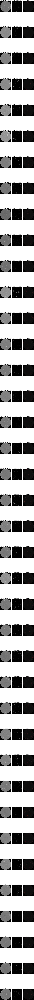

In [9]:
#Sample 2 has a relatively high amount of fracture-filling carbonate mineralization occurring in the sample

# Folder path
folder_path = "/Users/anna/Desktop/X-RayCT/SlicesCropped/2A-220-crop/"

# Filenames
image_files = ["2A-150-220kv.png","2A-200-220kv.png","2A-250-220kv.png","2A-300-220kv.png","2A-350-220kv.png","2A-400-220kv.png",
               "2A-450-220kv.png","2A-500-220kv.png","2A-550-220kv.png","2A-600-220kv.png","2A-650-220kv.png","2A-700-220kv.png","2A-750-220kv.png",
               "2A-800-220kv.png","2A-850-220kv.png","2A-900-220kv.png","2A-950-220kv.png","2A-1000-220kv.png","2A-1050-220kv.png","2A-1100-220kv.png"
               ,"2A-1150-220kv.png","2A-1200-220kv.png","2A-1250-220kv.png","2A-1300-220kv.png", "2A-1350-220kv.png","2A-1400-220kv.png","2A-1450-220kv.png","2A-1500-220kv.png","2A-1550-220kv.png"
               ,"2A-1600-220kv.png","2A-1650-220kv.png","2A-1700-220kv.png","2A-1750-220kv.png","2A-1800-220kv.png","2A-1850-220kv.png","2A-1900-220kv.png","2A-1950-220kv.png","2A-2000-220kv.png","2A-2050-220kv.png"]
#serpentine
#lower_threshold = 54
#upper_threshold = 55

#Carbonate
lower_threshold = 34
upper_threshold = 35

# Create a figure for the images and overlays
plt.figure(figsize=(12, 9 * len(image_files)))

# Loop through each image file
for i, image_file in enumerate(image_files):
    # Full path to the image
    image_path = os.path.join(folder_path, image_file)
    
    # Load the image and convert to grayscale
    ct_image = Image.open(image_path).convert("L")
    
    # Convert the image to a NumPy array
    ct_array = np.array(ct_image)
    
    # Create a mask for the segmented region
    segmented_mask = (ct_array >= lower_threshold) & (ct_array <= upper_threshold)
    
    # Create a color overlay with transparency
    overlay = np.zeros((*ct_array.shape, 3), dtype=np.uint8)  # Create an RGB image
    overlay[..., 0] = 255  # Red channel for the overlay
    overlay[~segmented_mask] = 0  # Set non-segmented areas to black
    
    # Combine original image and overlay using alpha blending
    alpha = 0.5  # Transparency level (0 = fully transparent, 1 = fully opaque)
    overlayed_image = np.dstack([ct_array] * 3)  # Convert grayscale to RGB
    overlayed_image = overlayed_image * (1 - alpha) + overlay * alpha
    
    # Plot the original, segmented, and overlayed images
    plt.subplot(len(image_files), 3, 3 * i + 1)
    plt.imshow(ct_array, cmap="gray")
    plt.title(f"Original CT Scan Image: {image_file}")
    plt.axis("off")
    
    plt.subplot(len(image_files), 3, 3 * i + 2)
    plt.imshow(segmented_mask, cmap="gray")
    plt.title(f"Segmented Mask ({lower_threshold}-{upper_threshold} Intensity)")
    plt.axis("off")
    
    plt.subplot(len(image_files), 3, 3 * i + 3)
    plt.imshow(overlayed_image.astype(np.uint8))
    plt.title(f"Overlayed Image")
    plt.axis("off")

plt.tight_layout()
#plt.savefig('1A-85-350-segmented(40-41).png')
plt.show()

In [7]:
# Folder path
folder_path = "/Users/anna/Desktop/X-RayCT/SlicesCropped/2A-220-crop/"

# Filenames
image_files = ["2A-150-220kv.png","2A-200-220kv.png","2A-250-220kv.png","2A-300-220kv.png","2A-350-220kv.png","2A-400-220kv.png",
               "2A-450-220kv.png","2A-500-220kv.png","2A-550-220kv.png","2A-600-220kv.png","2A-650-220kv.png","2A-700-220kv.png","2A-750-220kv.png",
               "2A-800-220kv.png","2A-850-220kv.png","2A-900-220kv.png","2A-950-220kv.png","2A-1000-220kv.png","2A-1050-220kv.png","2A-1100-220kv.png"
               ,"2A-1150-220kv.png","2A-1200-220kv.png","2A-1250-220kv.png","2A-1300-220kv.png", "2A-1350-220kv.png","2A-1400-220kv.png","2A-1450-220kv.png","2A-1500-220kv.png","2A-1550-220kv.png"
               ,"2A-1600-220kv.png","2A-1650-220kv.png","2A-1700-220kv.png","2A-1750-220kv.png","2A-1800-220kv.png","2A-1850-220kv.png","2A-1900-220kv.png","2A-1950-220kv.png","2A-2000-220kv.png","2A-2050-220kv.png"]


# Intensity threshold
lower_threshold = 34
upper_threshold = 35

total_core_pixels = 0
total_core_segmented_pixels = 0

# Loop through each image file
for image_file in image_files:
    # Full path to the image
    image_path = os.path.join(folder_path, image_file)
    
    # Load the image and convert to grayscale
    ct_image = Image.open(image_path).convert("L")
    
    # Convert the image to a NumPy array
    ct_array = np.array(ct_image)
    
    # Create a mask for the segmented region
    segmented_mask = (ct_array >= lower_threshold) & (ct_array <= upper_threshold)
    
    # Calculate percentage
    total_pixels = ct_array.size
    segmented_pixels = np.sum(segmented_mask)
    percentage = (segmented_pixels / total_pixels) * 100
    
    print(f"Image: {image_file} - Percentage of pixels in range {lower_threshold}-{upper_threshold}: {percentage:.2f}%")
    
    # Accumulate totals for entire core
    total_core_pixels += total_pixels
    total_core_segmented_pixels += segmented_pixels

# Calculate overall percentage for the entire core
if total_core_pixels > 0:
    total_core_percentage = (total_core_segmented_pixels / total_core_pixels) * 100
    print(f"Total Core - Percentage of pixels in range {lower_threshold}-{upper_threshold}: {total_core_percentage:.2f}%")

Image: 2A-150-220kv.png - Percentage of pixels in range 34-35: 0.47%
Image: 2A-200-220kv.png - Percentage of pixels in range 34-35: 0.48%
Image: 2A-250-220kv.png - Percentage of pixels in range 34-35: 0.48%
Image: 2A-300-220kv.png - Percentage of pixels in range 34-35: 0.46%
Image: 2A-350-220kv.png - Percentage of pixels in range 34-35: 0.47%
Image: 2A-400-220kv.png - Percentage of pixels in range 34-35: 0.43%
Image: 2A-450-220kv.png - Percentage of pixels in range 34-35: 0.61%
Image: 2A-500-220kv.png - Percentage of pixels in range 34-35: 0.49%
Image: 2A-550-220kv.png - Percentage of pixels in range 34-35: 0.53%
Image: 2A-600-220kv.png - Percentage of pixels in range 34-35: 0.57%
Image: 2A-650-220kv.png - Percentage of pixels in range 34-35: 0.51%
Image: 2A-700-220kv.png - Percentage of pixels in range 34-35: 0.54%
Image: 2A-750-220kv.png - Percentage of pixels in range 34-35: 0.47%
Image: 2A-800-220kv.png - Percentage of pixels in range 34-35: 0.57%
Image: 2A-850-220kv.png - Percenta